# FastForman - An efficient Forman-Ricci Curvature computation for higher-order faces in Simplicial Complexes

 Here, we provide a set-theoretical Python coding for efficiently computing Forman-Ricci Curvature (FRC) for simplicial complexes.

This code development was based on our work on [1]. A benchmark comparison with other Python algorithms in the literature for computing FRC can be found in [2].

## Content:

- `fastforman.pyx`
- `compyler.py`
- `setup.py`
- `Example.ipynb`

## Python version: 
    3.8.5
## Package requirement:

- `numpy==1.23.0`
- `networkx==2.6.3`
- `gudhi==3.5.0`
- `cython==0.29.21`
- `distutils==3.8.5`


## Installation:

The files `fastforman.pyx`, `compiler.py` and `setup.py` must be placed at the same directory.

 ### Local installation:
To this purpose, the user will need to compile the file `compiler.py` in cython by running the command:

```
python3 compiler.py build_ext --inplace
```

### Global installation:

Run `setup.py` by executing the command:

```
pip install .
```

After successful compilation, the generated `fastforman` file can be imported as a package, for instance:

```python
import fastforman as ff
```
## Functions:

- ``compute_FRC``:

  ***Input:*** 
        
    - `D`: A dictionary in which the keys are integer numbers from 0 to len(D)-1 and the values are the N-dimensional points
    - `cutoff`: Float number for the threshold distance between points
    - `dim`: Integer, the maximum simplex dimension to compute FRC.,
   
    
    
   ***Output:*** 
     
   A dictionary in which the keys are the dimension and the values are dictionary whose values keys are the simpleces and the values are the respective FRC.
    
    


- ``compute_average_FRC``:

  ***Input:*** 
        
    - `D`: A dictionary in which the keys are integer numbers from 0 to len(D)-1 and the values are the N-dimensional points
    - `cutoff`: Float number for the threshold distance between points
    - `dim`: Integer, the maximum simplex dimension to compute FRC.,
   
    
    
   ***Output:*** 
     
   A dictionary in which the keys are the dimension and the values are the average FRC for fixed dimension.
    
    
- ``compute_FRC_frequency``:

     ***Input:*** 
        
    - `D`: A dictionary in which the keys are integer numbers from 0 to len(D)-1 and the values are the N-dimensional points
    - `cutoff`: Float number for the threshold distance between points
    - `dim`: Integer, the maximum simplex dimension to compute FRC.,
   
    
   ***Output:*** A dictionary in which the keys are the dimension and the values is a dictionary of the frequency of FRC values.
    
Below, we provide some examples.

## Contact and Support:

danillo.dbs16@gmail.com, dbarros@bcamath.org

## References: 

If you appreciate our work, please, cite us:
[1] Efficient set-theoretic algorithms for computing high-order Forman-Ricci curvature on abstract simplicial complexes; Barros de Souza, Danillo; da Cunha, Jontatas, A.N. Santos, Fernando; Jost, Juergen & Rodigues, Serafim; Link: https://arxiv.org/html/2308.11763v4

[2] Forman-Ricci curvature Benchmark report, Kaggle repository, Link: https://www.kaggle.com/datasets/danillosouza2020/forman-ricci-curvature-benchmark-report

## Importing Packages for the data visualization:

In [1]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.spatial.distance import pdist, squareform
from random import shuffle
import numpy as np
import pandas as pd
from plotly.offline import plot

/Users/danillosouza/opt/anaconda3/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


## Importing *fastforman*:

In [2]:
import fastforman as ff

In [3]:
#Compute cells (cliques) using Gudhi package:
def cliques_gudhi(data,f,d=2):
   
    skeleton = gd.RipsComplex(points = data, max_edge_length = f)
    Rips_simplex_tree_sample = skeleton.create_simplex_tree(max_dimension = d)
    rips_generator = Rips_simplex_tree_sample.get_filtration()

    L=[i[0] for i in rips_generator]

    return L


In [4]:
#Compute cells (cliques) using Gudhi package:
def cliques_gudhi_from_graph(G,f,d=2):
    M=nx.to_numpy_array(G)
    skeleton = gd.RipsComplex(distance_matrix = M, max_edge_length = f)
    Rips_simplex_tree_sample = skeleton.create_simplex_tree(max_dimension = d)
    rips_generator = Rips_simplex_tree_sample.get_filtration()

    L=[i[0] for i in rips_generator if i[1]>0]

    return L


In [5]:
def graph_from_cloud(data,e=2):
    G=nx.Graph()
    G.add_nodes_from([i for i in range(len(data))])
    counter=0
    for pair in data:
        G.add_node(counter,pos=(pair[0],pair[1],pair[2]))
        counter+=1
    pos_dict=nx.get_node_attributes(G,"pos")
    
    for pair in combinations(list(G.nodes()),2):
        n,m=pair
        X=pos_dict[n]
        Y=pos_dict[m]
       
        d=dist(X,Y)
        if d<=e:
            G.add_edge(n,m)
            G[n][m]['weight']=d
    return G

In [6]:
def run_fastforman(data,f,d=2):
    
    #Computing the simplices up to the fixed dimension:
    L=[i for i in cliques_gudhi(data,f,d) if len(i)>=2]
   
    #Generating graph from provided data adn threshold:
    G=graph_from_cloud(data,f)
    Neigh={n:set(nx.neighbors(G,n)) for n in G.nodes()}
    
    t0=time()
    F=ff.fastforman(L,Neigh)
    f={dim:{} for dim in range(1,d+1)}
    for c in F.keys():
    
        f[len(c)-1][c]=F[c]
    
          
    t1=time()
    print("Total time processing: "+str(t1-t0)+" seconds")
    return t1-t0,f


# Computing FRC from point cloud data:

Defining functions for generating 3D point cloud data on Sphere, Torus ans Möbius strip and cube, respectively:

### Defining functions for generating random 3D points:

In [7]:
def gen_torus_point(a,c):
    u,v=2*np.pi*np.random.uniform(0,1,2)
    x=(c+a*np.cos(v))*np.cos(u)
    y=(c+a*np.cos(v))*np.sin(u)
    z=a*np.sin(v)
    return (x,y,z)

In [8]:
def gen_mobius_point(r,s):
    t=2*np.pi*np.random.uniform(-1,1)
    x=(r+s*np.cos(0.5*t))*np.cos(t)
    y=(r+s*np.cos(0.5*t))*np.sin(t)
    z=s*np.sin(0.5*t)
    return (x,y,z)

In [9]:
def gen_cube_point(d):
    extremes=[-d,d]
    x=np.random.uniform(-d,d)
    y=np.random.uniform(-d,d)
    point=[x,y,extremes[np.random.randint(2)]]
    shuffle(point)
    return point
    

Defining function to visualize those points:

In [41]:
def plot3DPoints(points,threshold,title):
  


    data=pd.DataFrame()

    data["X"]=[i[0] for i in points]
    data["Y"]=[i[1] for i in points]
    data["Z"]=[i[2] for i in points]


    # Calculate pairwise distances
    distances = squareform(pdist(data[['X', 'Y', 'Z']]))


    # Create edge list based on threshold
    edges = []
    for i in range(len(data)):
        for j in range(i+1, len(data)):
            if distances[i, j] <= threshold:
                edges.append((i, j))

    # Create scatter plot
    fig = go.Figure()

    # Add scatter plot for points
    fig.add_trace(go.Scatter3d(
        x=data['X'],
        y=data['Y'],
        z=data['Z'],
        mode='markers',
        marker=dict(
            size=5,
            color='blue',
            opacity=0.5
        ),
        name='Points'
    ))

    # Add scatter plot for edges
    edge_x = []
    edge_y = []
    edge_z = []
    for edge in edges:
        edge_x.extend([data['X'][edge[0]], data['X'][edge[1]], None])
        edge_y.extend([data['Y'][edge[0]], data['Y'][edge[1]], None])
        edge_z.extend([data['Z'][edge[0]], data['Z'][edge[1]], None])

    fig.add_trace(go.Scatter3d(
        x=edge_x,
        y=edge_y,
        z=edge_z,
        mode='lines',
        line=dict(color='red', width=2),
        name='Edges'
    ))
    fig.update_layout(
        title=title
    )
        # Show plot
    
    fig.show()
   

    

Importing Packages:

In [11]:
import numpy as np
import gudhi as gd
from itertools import combinations

Importing Packages for the data visualization:

In [12]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from scipy.spatial.distance import pdist, squareform

Generating sets of 1000 points each:

In [13]:
torus_points=[gen_torus_point(1,2) for i in range(1000)]
sphere_points=[gen_torus_point(2,0) for i in range(1000)]
mobius_points=[gen_mobius_point(3,np.random.uniform(0.,2)) for i in range(1000)]
cube_points=[gen_cube_point(1) for i in range(1000)]

Setting the threshold distance between points:

In [14]:
Threshold=0.5

Ploting points:

In [42]:
plot3DPoints(sphere_points,Threshold,"Random 3D-Sphere points - Threshold: "+str(Threshold))
plot3DPoints(torus_points,Threshold,"Random 3D-Torus points - Threshold: "+str(Threshold))

In [43]:
plot3DPoints(mobius_points,Threshold,"Random 3D-Mobius Strip points - Threshold: "+str(Threshold))
plot3DPoints(cube_points,Threshold,"Random 3D-Cube points - Threshold: "+str(Threshold))

Generating random 1000 points in the torus, sphere, Mobius strip and cube, respectively:

In [17]:
torus_points=[gen_torus_point(1,2) for i in range(1000)]
sphere_points=[gen_torus_point(2,0) for i in range(1000)]
mobius_points=[gen_mobius_point(3,np.random.uniform(0.,2)) for i in range(1000)]
cube_points=[gen_cube_point(1) for i in range(1000)]

Creating dictionary of those points:

In [18]:
Sphere={i:sphere_points[i] for i in range(len(sphere_points))}
Torus={i:torus_points[i] for i in range(len(torus_points))}
Mobius={i:mobius_points[i] for i in range(len(mobius_points))}
Cube={i:cube_points[i] for i in range(len(mobius_points))}

Computing FRC for the Sphere: 

In [19]:
Frec_Sphere=ff.compute_FRC_frequency(Sphere,Threshold,3)

(-100.0, 100.0)

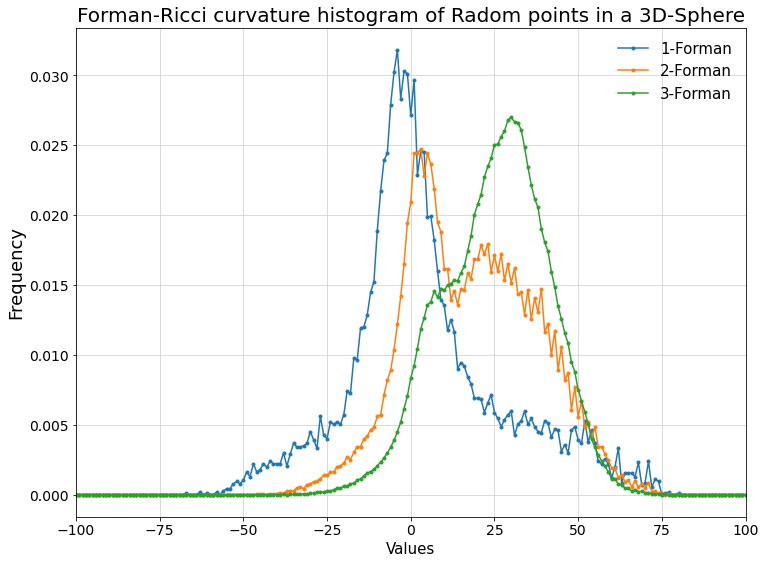

In [20]:
plt.figure(figsize=(12,9))
for d in Frec_Sphere.keys():
    Prob=np.array(list(Frec_Sphere[d].values()))
    Prob=Prob/sum(Prob)
    plt.plot(list(Frec_Sphere[d].keys()),Prob,marker=".",label=str(d)+"-Forman")
plt.legend(framealpha=0,fontsize=15)
plt.title("Forman-Ricci curvature histogram of Radom points in a 3D-Sphere", fontsize=20)
plt.xlabel("Values",fontsize=15)
plt.ylabel("Frequency",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(color="lightgray")
plt.xlim(-100,100)

Computing FRC for the torus:

In [21]:
Frec_Torus=ff.compute_FRC_frequency(Torus,Threshold,3)

(-100.0, 100.0)

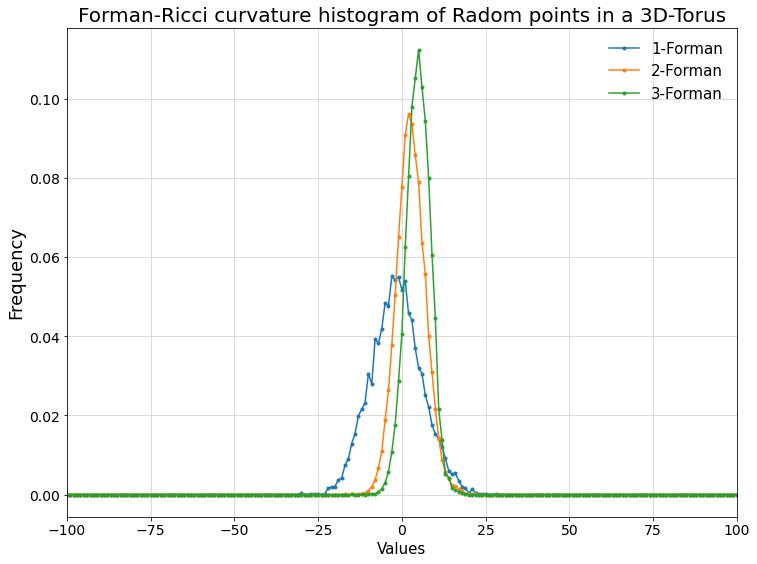

In [22]:
plt.figure(figsize=(12,9))
for d in Frec_Torus.keys():
    Prob=np.array(list(Frec_Torus[d].values()))
    Prob=Prob/sum(Prob)
    plt.plot(list(Frec_Torus[d].keys()),Prob,marker=".",label=str(d)+"-Forman")
plt.legend(framealpha=0,fontsize=15)
plt.title("Forman-Ricci curvature histogram of Radom points in a 3D-Torus", fontsize=20)
plt.xlabel("Values",fontsize=15)
plt.ylabel("Frequency",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(color="lightgray")
plt.xlim(-100,100)

Computing FRC for the Mobius strip:

In [23]:
Frec_Mobius=ff.compute_FRC_frequency(Mobius,Threshold,3)

(-100.0, 100.0)

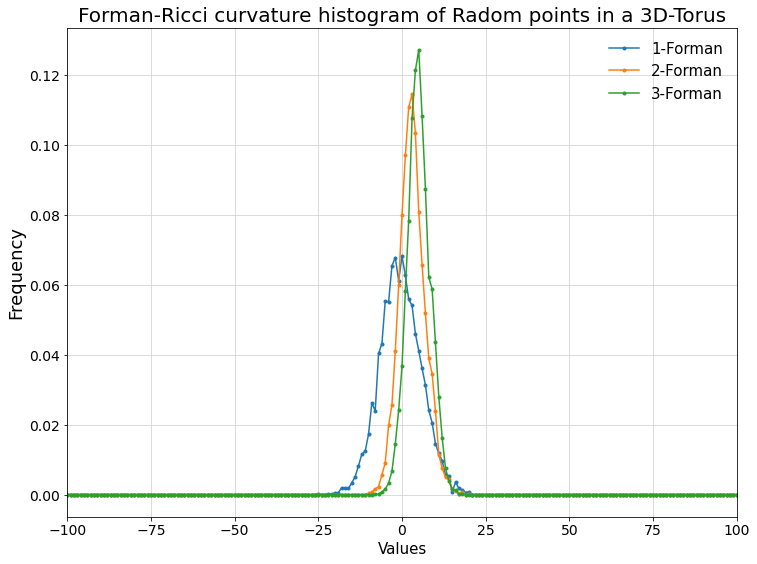

In [24]:
plt.figure(figsize=(12,9))
for d in Frec_Mobius.keys():
    Prob=np.array(list(Frec_Mobius[d].values()))
    Prob=Prob/sum(Prob)
    plt.plot(list(Frec_Mobius[d].keys()),Prob,marker=".",label=str(d)+"-Forman")
plt.legend(framealpha=0,fontsize=15)
plt.title("Forman-Ricci curvature histogram of Radom points in a 3D-Torus", fontsize=20)
plt.xlabel("Values",fontsize=15)
plt.ylabel("Frequency",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(color="lightgray")
plt.xlim(-100,100)

Computing FRC for the cube:

In [25]:
Frec_Cube=ff.compute_FRC_frequency(Cube,Threshold,3)

(-100.0, 100.0)

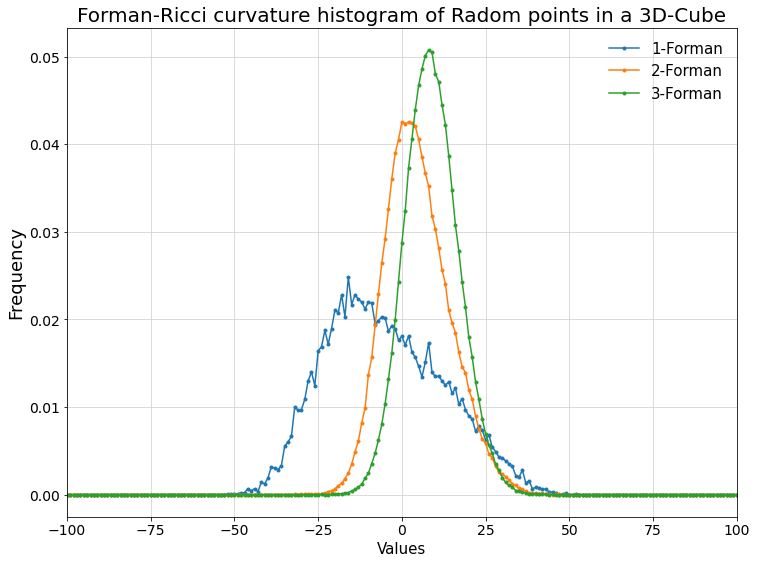

In [26]:
plt.figure(figsize=(12,9))
for d in Frec_Cube.keys():
    Prob=np.array(list(Frec_Cube[d].values()))
    Prob=Prob/sum(Prob)
    plt.plot(list(Frec_Cube[d].keys()),Prob,marker=".",label=str(d)+"-Forman")
plt.legend(framealpha=0,fontsize=15)
plt.title("Forman-Ricci curvature histogram of Radom points in a 3D-Cube", fontsize=20)
plt.xlabel("Values",fontsize=15)
plt.ylabel("Frequency",fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(color="lightgray")
plt.xlim(-100,100)

Plotting the results:

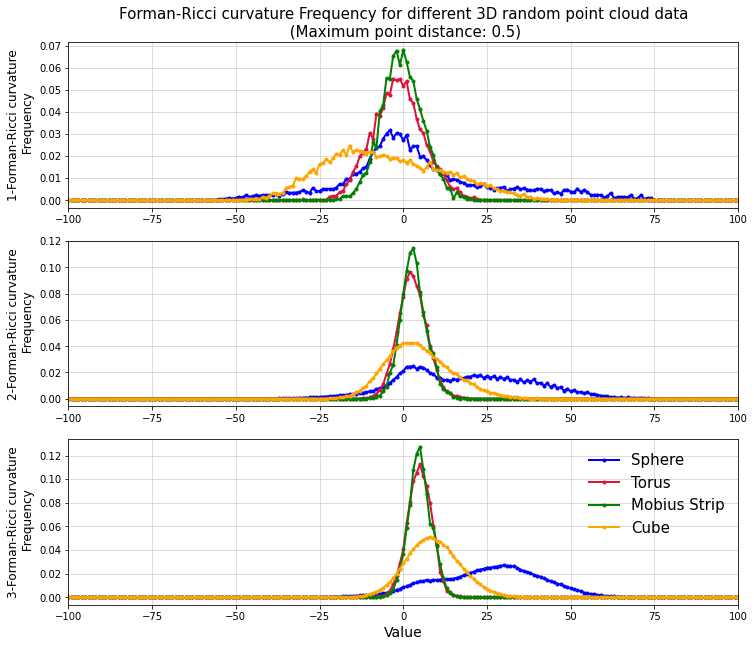

In [27]:
Frecs=[Frec_Sphere,Frec_Torus,Frec_Mobius,Frec_Cube]
Labels=["Sphere","Torus","Mobius Strip","Cube"]
Colors=["Blue","crimson","Green","orange"]

plt.figure(figsize=(12,14))
counter=0

for d in [1,2,3]:
    counter+=1
    c=-1
    plt.subplot(4,1,counter)
    if d==1:
        plt.title("Forman-Ricci curvature Frequency for different 3D random point cloud data\n (Maximum point distance: "+str(Threshold)+")",fontsize=15)
    plt.ylabel(str(d)+"-Forman-Ricci curvature\n Frequency",fontsize=12)
    for Frec in Frecs:
        c+=1
        Prob=np.array(list(Frec[d].values()))
        Prob=Prob/sum(Prob)
        plt.plot(list(Frec[d].keys()),Prob,marker=".",label=Labels[c],color=Colors[c],lw=2)
        plt.xlim(-100,100)
        plt.grid(color="lightgray")
plt.xlabel("Value",fontsize=14)       
plt.legend(framealpha=0,fontsize=15,loc="upper right")

# Conclusions:

- It is expected that the Mobius stip and the torus has the same geometric features. This explains the similarity between the curves;
- Despite being topologically possible to deform a sphere into a cube, the geometric features clearly different throught a geometrical point of view;
- The quality of those curves increases with the curvature dimension.